## <center> Индивидуальный проект по анализу данных </center>

ФИО, номер группы: Суворов Артём Андреевич, 19БИ-3


## I Подготовка данных

**0.25 балла**

  1) Описание набора данных и признаков (на русском языке). Первичный анализ данных (describe, info , shape) 
     
**1.25 балла** 

  2) Первичный визуальный анализ признаков (используйте matplotlib, seaborn и виды графиков, которые рассматривали на занятиях)

**0.25 балла**

  3) Закономерности, особенности данных которые увидели на глаз - опишите словами 
  
**Разделите выборку на train/test 0.7/0.3, stratify = y, random_state = 17 (п.4 и п.5 обучать ТОЛЬКО на train части)**

**1 балл**

  4) Отбор признаков (корреляция, проверка на выбросы (z-score)) - удалить сильно скоррелированные фичи, фичи с большим кол-вом пропусков/выбросов(если >70%)
  
**1.25 балла**

  5) Преобразование признаков (Масштабирование, заполнение пропусков, label encoding, создание новых признаков. Завернуть преобразования в pipeline) 
  
## II Обучение модели классификации
6) Обучите модели KNN (**0.8 балла** ), лог регрессия(**1 балл**), random forest (**1 балл**), один любой ансамбль (**1.2 балла**) (из sklearn  - Hard Voting/Soft Voting/Stacking/GradientBoosting/AdaBoost, из библиотеки https://xgboost.readthedocs.io/en/latest/python/python_api.html XGBoost)

 - Задать кросс-валидацию(StratifiedKFold), подобрать гиперпараметры(минимум 5 различных гиперпараметров), если параметров много применить RandomizedSearchCV
 - Сделать прогноз roc_auc для X_test и holdout выборок.
 - Нарисовать на графике как меняется ROC-AUC score на train и test и holdout выборках в зависимости от перебора значений основного гиперпараметра (у knn - n_neighbors, log_regression - C, деревья - max_depth; остальным гиперпараметрам модели присвоить оптимальные значения с предыдущего шага)
 
 
## III Выбор наилучшей модели 

**2 балла**

 7) Проведите сравнительный анализ между всеми моделями - сравните accuracy_score и roc_auc на test, holdout выборки, сравните времени работы модели(время за которое выполняется предсказание). Выберите наилучшую.


In [ ]:
from __future__ import division, print_function
# отключим всякие предупреждения Anaconda
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

%pylab inline

Populating the interactive namespace from numpy and matplotlib


###  Часть 1. Подготовка данных

In [ ]:
data = pd.read_csv('data_2.csv')
print(data.shape)
data

(409, 33)


,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,854941,B,13.03,18.42,82.61,523.8,0.08983,0.03766,0.025620,0.029230,0.1467,0.05863,0.1839,2.3420,1.170,14.160,0.004352,0.004899,0.013430,0.011640,0.026710,0.001777,13.300,22.81,84.46,545.9,0.09701,0.04619,0.04833,0.05013,0.1987,0.06169,NaN
1,868202,M,12.77,22.47,81.72,506.3,0.09055,0.05761,0.047110,0.027040,0.1585,0.06065,0.2367,1.3800,1.457,19.870,0.007499,0.012020,0.023320,0.008920,0.016470,0.002629,14.490,33.37,92.04,653.6,0.14190,0.15230,0.21770,0.09331,0.2829,0.08067,NaN
2,9113239,B,13.24,20.13,86.87,542.9,0.08284,0.12230,0.101000,0.028330,0.1601,0.06432,0.2810,0.8135,3.369,23.810,0.004929,0.066570,0.076830,0.013680,0.015260,0.008133,15.440,25.50,115.00,733.5,0.12010,0.56460,0.65560,0.13570,0.2845,0.12490,NaN
3,8712064,B,12.34,22.22,79.85,464.5,0.10120,0.10150,0.053700,0.028220,0.1551,0.06761,0.2949,1.6560,1.955,21.550,0.011340,0.031750,0.031250,0.011350,0.018790,0.005348,13.580,28.68,87.36,553.0,0.14520,0.23380,0.16880,0.08194,0.2268,0.09082,NaN
4,89346,B,9.00,14.40,56.36,246.3,0.07005,0.03116,0.003681,0.003472,0.1788,0.06833,0.1746,1.3050,1.144,9.789,0.007389,0.004883,0.003681,0.003472,0.027010,0.002153,9.699,20.07,60.90,285.5,0.09861,0.05232,0.01472,0.01389,0.2991,0.07804,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
404,912519,B,13.47,14.06,87.32,546.3,0.10710,0.11550,0.057860,0.052660,0.1779,0.06639,0.1588,0.5733,1.102,12.840,0.004450,0.014520,0.013340,0.008791,0.016980,0.002787,14.830,18.32,94.94,660.2,0.13930,0.24990,0.18480,0.13350,0.3227,0.09326,NaN
405,8810436,B,15.27,12.91,98.17,725.5,0.08182,0.06230,0.058920,0.031570,0.1359,0.05526,0.2134,0.3628,1.525,20.000,0.004291,0.012360,0.018410,0.007373,0.009539,0.001656,17.380,15.92,113.70,932.7,0.12220,0.21860,0.29620,0.10350,0.2320,0.07474,NaN
406,914101,B,12.46,12.83,78.83,477.3,0.07372,0.04043,0.007173,0.011490,0.1613,0.06013,0.3276,1.4860,2.108,24.600,0.010390,0.010030,0.006416,0.007895,0.028690,0.004821,13.190,16.36,83.24,534.0,0.09439,0.06477,0.01674,0.02680,0.2280,0.07028,NaN
407,90944601,B,13.78,15.79,88.37,585.9,0.08817,0.06718,0.010550,0.009937,0.1405,0.05848,0.3563,0.4833,2.235,29.340,0.006432,0.011560,0.007741,0.005657,0.012270,0.002564,15.270,17.50,97.90,706.6,0.10720,0.10710,0.03517,0.03312,0.1859,0.06810,NaN


In [60]:
data.describe()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
count,4.090000e+02,409.000000,409.000000,409.000000,409.000000,409.000000,409.000000,409.000000,409.000000,409.000000,409.000000,409.000000,409.000000,409.000000,409.000000,409.000000,409.000000,409.000000,409.000000,409.000000,409.000000,409.000000,409.000000,409.000000,409.000000,409.000000,409.000000,409.000000,409.000000,409.000000,409.000000,0.0
mean,3.606581e+07,14.167183,19.316455,92.207628,660.393643,0.096336,0.103613,0.088552,0.049028,0.181607,0.062756,0.411837,1.222593,2.911896,41.592406,0.007093,0.025042,0.031796,0.011777,0.020527,0.003782,16.305487,25.556064,107.464401,887.838386,0.132137,0.248906,0.268515,0.114055,0.289280,0.083417,NaN
std,1.393777e+08,3.595538,4.352865,24.793006,358.385128,0.014339,0.053440,0.080772,0.039344,0.028033,0.007305,0.289778,0.577812,2.114714,49.532442,0.003122,0.017886,0.032632,0.006318,0.008086,0.002644,4.898871,6.125235,33.937527,579.336782,0.023587,0.154012,0.209136,0.067423,0.062847,0.017633,NaN
min,8.913000e+03,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.050240,0.111500,0.360200,0.757000,7.228000,0.001713,0.002252,0.000000,0.000000,0.007882,0.000895,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040,NaN
25%,8.692540e+05,11.600000,16.150000,74.520000,412.600000,0.086000,0.063730,0.026880,0.019520,0.161800,0.057480,0.234500,0.833900,1.614000,17.860000,0.005133,0.012730,0.014230,0.007620,0.015160,0.002211,12.900000,20.830000,83.690000,508.100000,0.115700,0.139800,0.105500,0.062030,0.248800,0.070830,NaN
50%,9.081940e+05,13.440000,18.900000,86.910000,557.200000,0.095160,0.091590,0.061540,0.033900,0.179400,0.061490,0.324900,1.081000,2.284000,24.600000,0.006432,0.019710,0.023840,0.010900,0.018690,0.003118,14.980000,25.400000,98.000000,686.500000,0.131500,0.211600,0.224100,0.099930,0.280900,0.079180,NaN
75%,8.910720e+06,16.160000,21.780000,106.300000,813.000000,0.105900,0.129800,0.129300,0.073400,0.196700,0.066000,0.505800,1.467000,3.430000,45.420000,0.008200,0.031260,0.040290,0.014710,0.024010,0.004492,19.280000,29.660000,127.300000,1124.000000,0.146400,0.320600,0.385300,0.160700,0.318700,0.091850,NaN
max,9.113205e+08,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,2.873000,4.885000,21.980000,542.200000,0.031130,0.135400,0.396000,0.052790,0.078950,0.029840,36.040000,49.540000,251.200000,4254.000000,0.222600,0.937900,1.252000,0.291000,0.663800,0.173000,NaN


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 409 entries, 0 to 408
Data columns (total 33 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       409 non-null    int64  
 1   diagnosis                409 non-null    object 
 2   radius_mean              409 non-null    float64
 3   texture_mean             409 non-null    float64
 4   perimeter_mean           409 non-null    float64
 5   area_mean                409 non-null    float64
 6   smoothness_mean          409 non-null    float64
 7   compactness_mean         409 non-null    float64
 8   concavity_mean           409 non-null    float64
 9   concave points_mean      409 non-null    float64
 10  symmetry_mean            409 non-null    float64
 11  fractal_dimension_mean   409 non-null    float64
 12  radius_se                409 non-null    float64
 13  texture_se               409 non-null    float64
 14  perimeter_se             4

In [ ]:
# признак Unnamed пустой, поэтому его выкинем заранее только для исследований

data_dropped = data.drop(columns=['Unnamed: 32'])

#### Описание

Данные представляют собой исследования на рак груди.

Характеристики вычисляются на основе оцифрованного изображения тонкоигольного аспирата (FNA) новообразования груди. Описаны характеристики ядер клеток, представленных на изображениях в трехмерном пространстве.

1) ID number - номер исследования <br>
2) Diagnosis (M = malignant, B = benign) - диагноз (злокачественный и доброкачественный)

10 реально ценнных признаков расчитаны следующим образом:

a) radius (радиус - среднее из расстояний от центра до периметра) <br>
b) texture (текстура - стандартное отклонение значений шкалы серого) <br>
c) perimeter - периметр <br>
d) area - площадь <br>
e) smoothness (гладкость - местная изменчивость в радиусе) <br>
f) compactness (компактность = perimeter<sup>2</sup> / area - 1.0) <br>
g) concavity (выгнутость - выраженность вогнутых участков контура) <br>
h) concave points (вогнутые точки - количество вогнутых участков контура) <br>
i) symmetry - симметрия <br>
j) fractal dimension (фрактальная размерность - "coastline approximation" - 1 (приближение береговой линни))

У каждой характетистики есть три измерения: среднее, худшее (среднее из 3 наибольших значений) и se - standard error

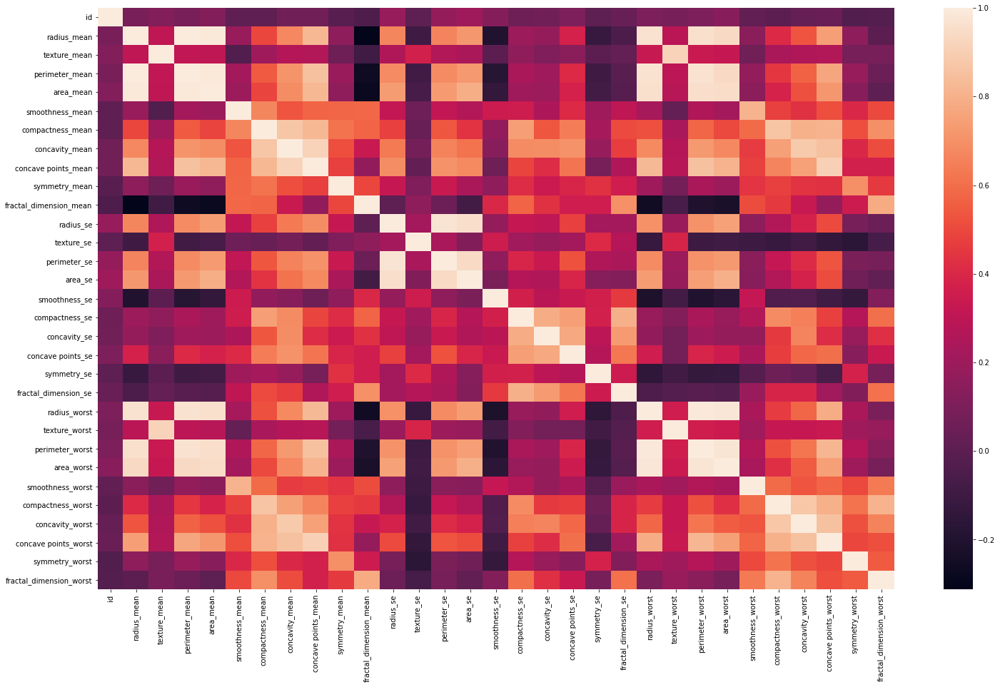

In [ ]:
plt.figure(figsize=(25, 15))
sns.heatmap(data=data_dropped.drop(columns=['diagnosis']).corr())

Можно видеть, что есть большая зависимость между признаками, описывающими размеры (радиус, периметр и площадь), что логично. 

В целом, больше всего корреляции замечается среди признаков worst-mean-se, что также логично, ведь они все взаимосвязанны, т.к. описывают одну величину с разных сторон. 

Есть дисбаланс классов, но не критично

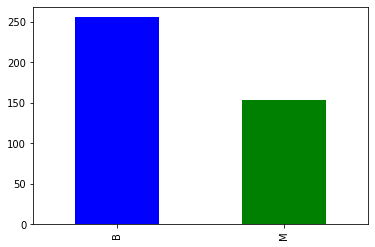

In [ ]:
data_dropped.diagnosis.value_counts().plot(kind='bar', color=['b', 'g'])

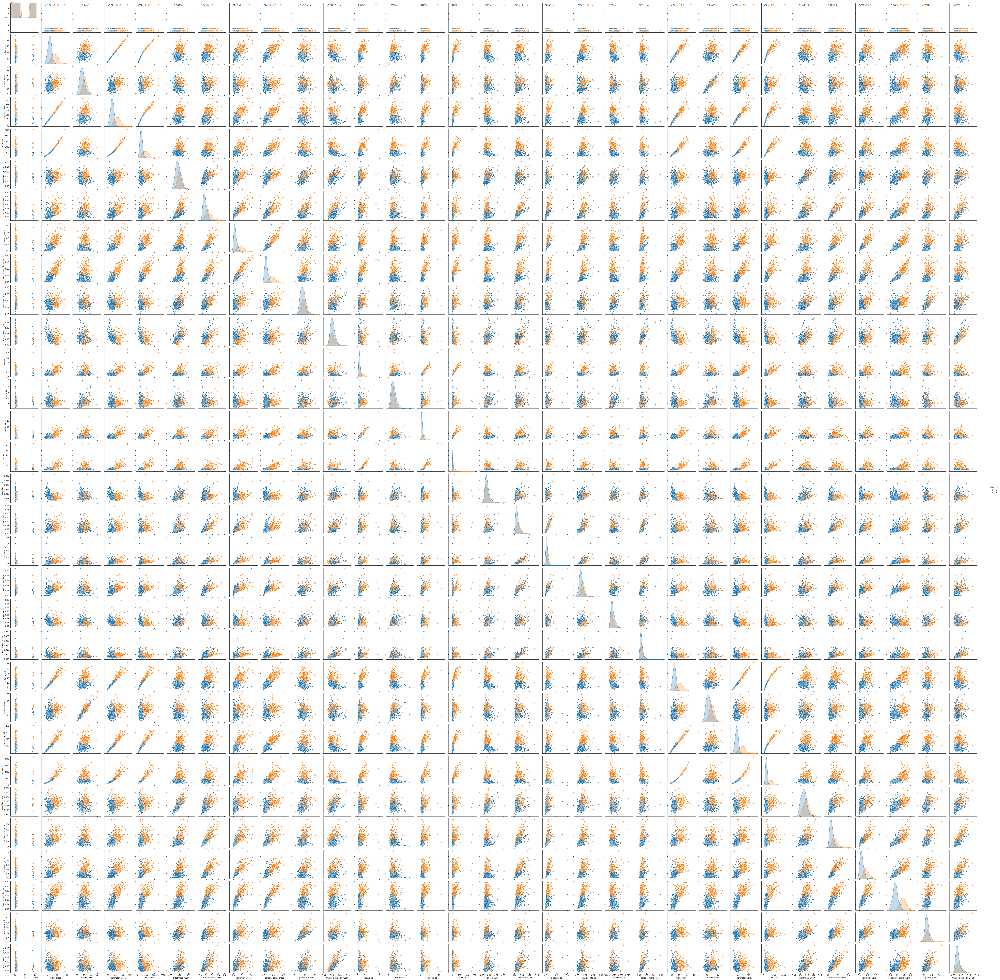

In [ ]:
sns.pairplot(data=data_dropped, hue='diagnosis')

Как можно видеть в некоторых графиках, бОльшие значения влияют на качество опухоли. Этот вывод будет развит дальше.

Рассмотрим распределения средних значений

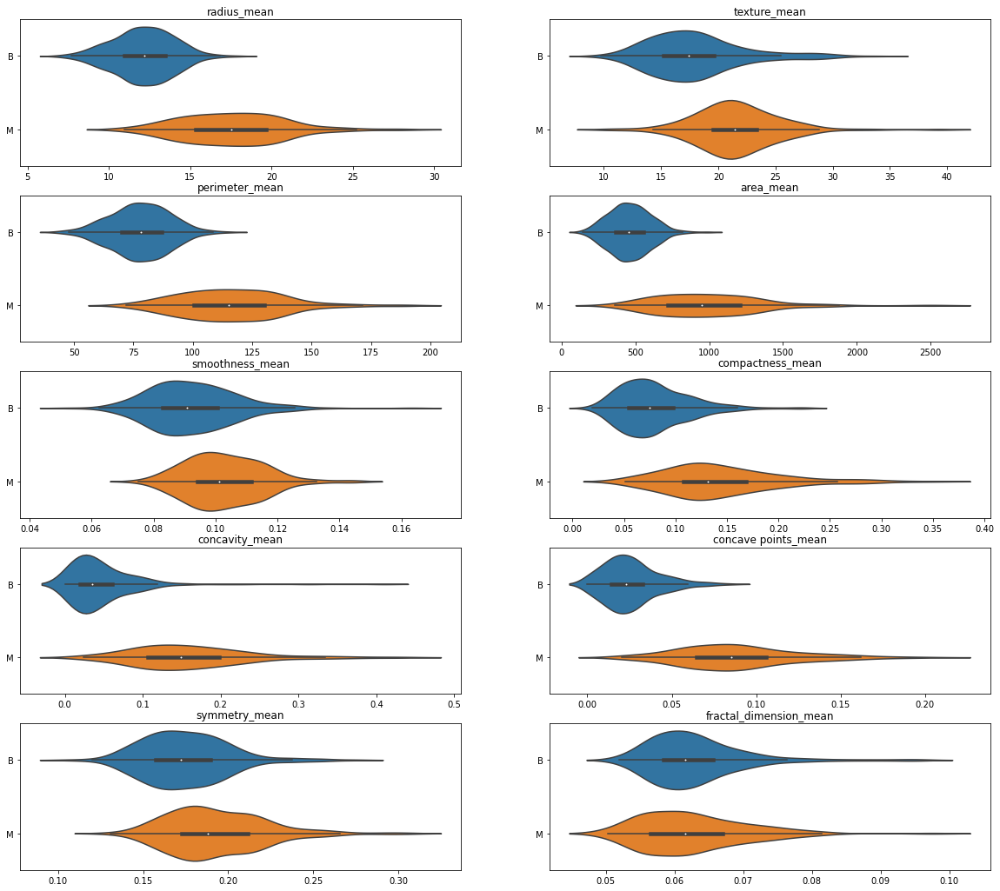

In [ ]:
means = [col for col in data_dropped.columns if 'mean' in col]

fig, axes = plt.subplots(ncols=2, nrows=5, figsize=(20, 18))

for mean, ax in zip(means, axes.flat):
    sns.violinplot(x=data_dropped[mean].values, y=data_dropped.diagnosis.values, hist=False, ax=ax).set_title(mean)

plt.show()

Как видно по графикам, все измерения с злокачественной опухолью "тяготеют" к бОльшим значениям (это видно и по медианам, и по общему смещению графиков). Также графики измерений со злокачественной опухолью получились более "растянутыми" и пологими. 

Рассмотрим распределения худших значений

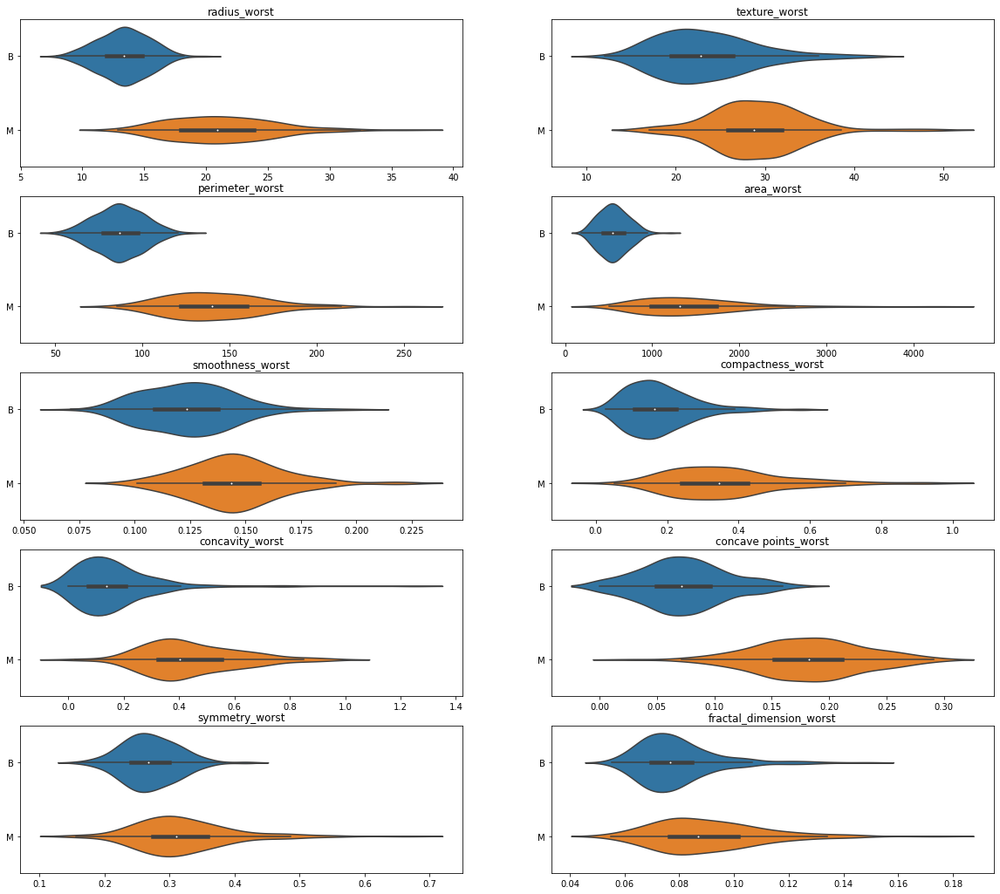

In [ ]:
worsts = [col for col in data_dropped.columns if 'worst' in col]

fig, axes = plt.subplots(ncols=2, nrows=5, figsize=(20, 18))

for worst, ax in zip(worsts, axes.flat):
    sns.violinplot(x=data_dropped[worst].values, y=data_dropped.diagnosis.values, hist=False, ax=ax).set_title(worst)

plt.show()

С худшими значениями ситуация такая же - чем больше измерение, тем, скорее присутствует злокачетсвенная опухоль

Ниже показано, как можно посчитать вероятность (или частоту, как оценку вероятности) злокачественной опухоли среди тех наблюдений, у которых 11 < ```texture_mean``` < 13

In [ ]:
means[1]

'texture_mean'

In [ ]:
data_dropped[(data_dropped[means[1]] < 13) & (data_dropped[means[1]] > 11)].diagnosis.value_counts()['M'] / data_dropped[(data_dropped[means[1]] < 13) & (data_dropped[means[1]] > 11)].diagnosis.count()

0.08333333333333333

Построим такие вероятности для всех значений из соответствующих признаков. Основаная идея: с ростом величины вероятность злокачественной опухоли повышается - проверим это

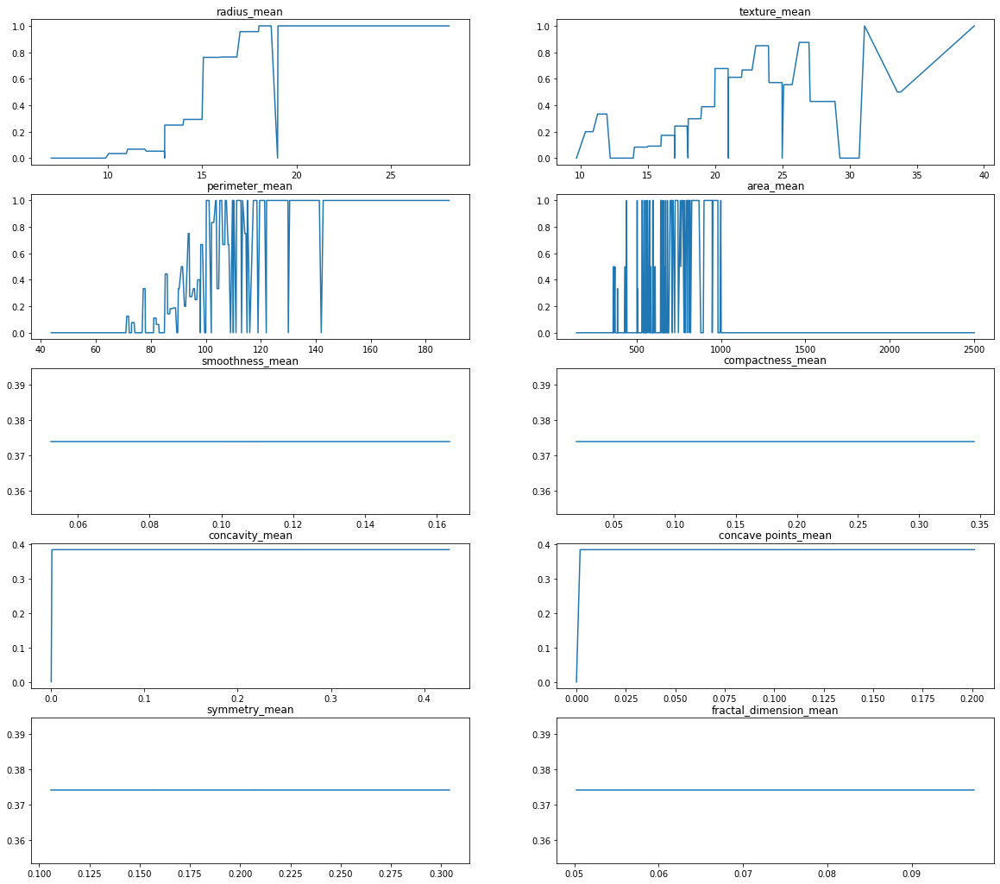

In [ ]:
fig, axes = plt.subplots(ncols=2, nrows=5, figsize=(20, 18))

for mean, ax in zip(means, axes.flat):
    probs_of_mal = []
    for val in data[mean].values:
        try:
            # округления, чтобы график получился менее "рваным"
            val_min = floor(val)
            val_max = ceil(val)
            cond = (data_dropped[mean] < val_max) & (data_dropped[mean] > val_min)
            prob = data_dropped[cond].diagnosis.value_counts()['M'] / data_dropped[cond].diagnosis.count()
        except KeyError:
            prob = 0
        probs_of_mal.append(prob)
    
    sns.lineplot(x=data_dropped[mean].values, y=probs_of_mal, ax=ax).set_title(mean)

plt.show()

Как можно видеть, идея верна - на многих графиках плотности вероятность злокачественной опухоли увеличивается с увеличением параметра

In [ ]:
from sklearn.model_selection import train_test_split

# для разделения быдем использовать старые данные

X = data.drop(columns=['diagnosis'])
y = data.diagnosis

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=17, stratify=y)

In [ ]:
X_train.isna().sum()

id                           0
radius_mean                  0
texture_mean                 0
perimeter_mean               0
area_mean                    0
smoothness_mean              0
compactness_mean             0
concavity_mean               0
concave points_mean          0
symmetry_mean                0
fractal_dimension_mean       0
radius_se                    0
texture_se                   0
perimeter_se                 0
area_se                      0
smoothness_se                0
compactness_se               0
concavity_se                 0
concave points_se            0
symmetry_se                  0
fractal_dimension_se         0
radius_worst                 0
texture_worst                0
perimeter_worst              0
area_worst                   0
smoothness_worst             0
compactness_worst            0
concavity_worst              0
concave points_worst         0
symmetry_worst               0
fractal_dimension_worst      0
Unnamed: 32                286
dtype: i

Пропусков нет совсем, что хорошо

Как уже было показано выше, есть большая корреляция среди троек mean-worst-se. Оставим только mean-признаки. 

Признак id не имеет никакого смысла, поэтому не будем его оставлять

Разобравшись с очевидными корреляциями, проверим остальные

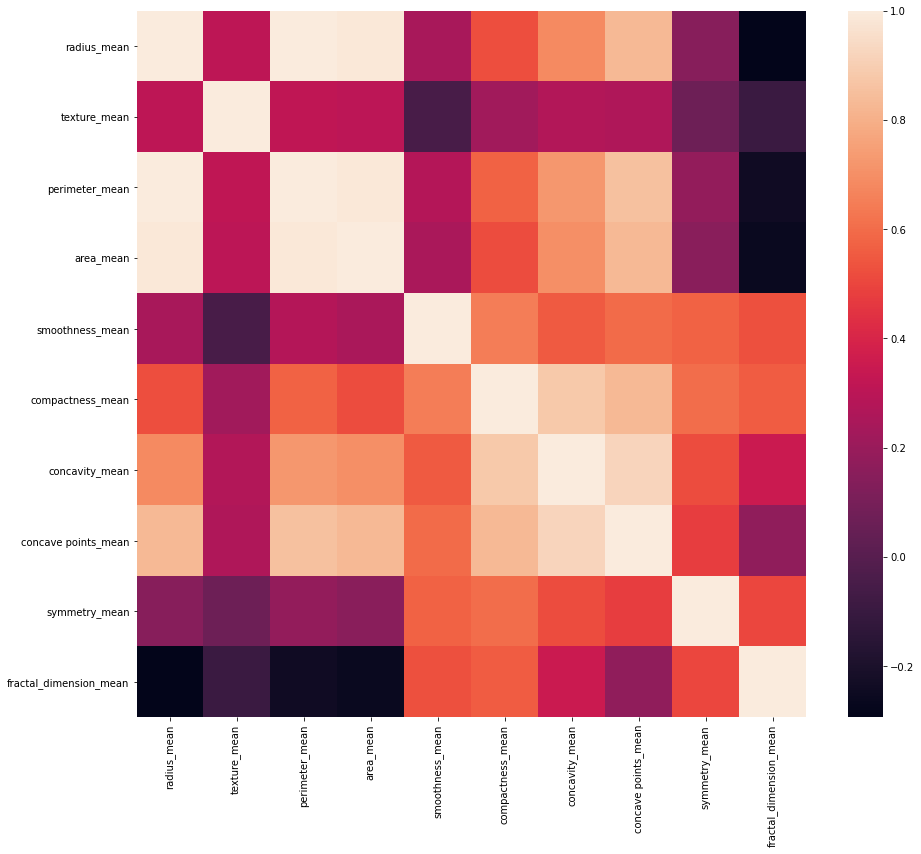

In [ ]:
plt.figure(figsize=(15, 13))
sns.heatmap(X_train[means].corr())  # на более ранних этапах уже вычисляли средние

Можно видеть, что от радиуса сильно зависит периметр и площадь. Оставим радиус

А вогнутость сильно влияет на компактность и зависит от числа вогнутых точек. Оставим только среднюю вогнутость.

In [ ]:
# снова удалим лишнее, но на итоговых данных это не будет использоваться
X_train_dropped = X_train[means].drop(columns=['perimeter_mean', 'area_mean', 'compactness_mean', 'concave points_mean'])

In [ ]:
z = np.abs(sp.stats.zscore(X_train_dropped))

zs = pd.DataFrame((z < 3), columns=X_train_dropped.columns)

In [ ]:
np.transpose(zs).all().value_counts()

True     270
False     16
dtype: int64

Если будем удалять данные, то у нас пропадут наблюдения. Сделаем это

In [ ]:
good_indexes_train = [i for i in np.transpose(zs).all().index if np.transpose(zs).all()[i]]

In [ ]:
np.shape(good_indexes_train)

(270,)

In [ ]:
X_train = X_train.iloc[good_indexes_train]
X_train

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
230,91805,8.571,13.10,54.53,221.3,0.10360,0.07632,0.025650,0.015100,0.1678,0.07126,0.1267,0.6793,1.0690,7.254,0.007897,0.017620,0.018010,0.007320,0.01592,0.003925,9.473,18.45,63.30,275.6,0.16410,0.22350,0.175400,0.085120,0.2983,0.10490,NaN
119,89143601,11.370,18.89,72.17,396.0,0.08713,0.05008,0.023990,0.021730,0.2013,0.05955,0.2656,1.9740,1.9540,17.490,0.006538,0.013950,0.013760,0.009924,0.03416,0.002928,12.360,26.14,79.29,459.3,0.11180,0.09708,0.075290,0.062030,0.3267,0.06994,NaN
98,85715,13.170,18.66,85.98,534.6,0.11580,0.12310,0.122600,0.073400,0.2128,0.06777,0.2871,0.8937,1.8970,24.250,0.006532,0.023360,0.029050,0.012150,0.01743,0.003643,15.670,27.95,102.80,759.4,0.17860,0.41660,0.500600,0.208800,0.3900,0.11790,NaN
134,921644,14.740,25.42,94.70,668.6,0.08275,0.07214,0.041050,0.030270,0.1840,0.05680,0.3031,1.3850,2.1770,27.410,0.004775,0.011720,0.019470,0.012690,0.01870,0.002626,16.510,32.29,107.40,826.4,0.10600,0.13760,0.161100,0.109500,0.2722,0.06956,NaN
303,873357,13.010,22.22,82.01,526.4,0.06251,0.01938,0.001595,0.001852,0.1395,0.05234,0.1731,1.1420,1.1010,14.340,0.003418,0.002252,0.001595,0.001852,0.01613,0.000968,14.000,29.02,88.18,608.8,0.08125,0.03432,0.007977,0.009259,0.2295,0.05843,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106,854268,14.250,21.72,93.63,633.0,0.09823,0.10980,0.131900,0.055980,0.1885,0.06125,0.2860,1.0190,2.6570,24.910,0.005878,0.029950,0.048150,0.011610,0.02028,0.004022,15.890,30.36,116.20,799.6,0.14460,0.42380,0.518600,0.144700,0.3591,0.10140,NaN
400,84300903,19.690,21.25,130.00,1203.0,0.10960,0.15990,0.197400,0.127900,0.2069,0.05999,0.7456,0.7869,4.5850,94.030,0.006150,0.040060,0.038320,0.020580,0.02250,0.004571,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.450400,0.243000,0.3613,0.08758,NaN
99,883852,11.300,18.19,73.93,389.4,0.09592,0.13250,0.154800,0.028540,0.2054,0.07669,0.2428,1.6420,2.3690,16.390,0.006663,0.059140,0.088800,0.013140,0.01995,0.008675,12.580,27.96,87.16,472.9,0.13470,0.48480,0.743600,0.121800,0.3308,0.12970,NaN
78,91544001,12.220,20.04,79.47,453.1,0.10960,0.11520,0.081750,0.021660,0.2124,0.06894,0.1811,0.7959,0.9857,12.580,0.006272,0.021980,0.039660,0.009894,0.01320,0.003813,13.160,24.17,85.13,515.3,0.14020,0.23150,0.353500,0.080880,0.2709,0.08839,NaN


In [ ]:
from sklearn.pipeline import make_union, make_pipeline
from sklearn.preprocessing import StandardScaler, FunctionTransformer
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer


def get_cols_for_drop(df):
    for_drop = list(set(df.columns) - set(get_cols(df).columns))
    return for_drop


def get_cols(df):
    forbidden = ['perimeter_mean', 'area_mean', 'compactness_mean', 'concave points_mean', 'Unnamed: 32']
    cols = [col for col, type_ in zip(df.columns, df.dtypes) if '64' in str(type_) and 'mean' in col and col not in forbidden]
    return df[cols]


vec = make_union(*[
    make_pipeline(FunctionTransformer(get_cols, validate=False), SimpleImputer(strategy='median'), StandardScaler()),
    make_pipeline(ColumnTransformer(transformers=[('dropper', 'drop', get_cols_for_drop(X_train))]))
])

In [ ]:
vec.fit(X_train)

X_train_transformed = pd.DataFrame(vec.transform(X_train), columns=get_cols(X_train).columns)
X_train_transformed

,radius_mean,texture_mean,smoothness_mean,concavity_mean,symmetry_mean,fractal_dimension_mean
0,-1.674907,-1.454533,0.630053,-0.795929,-0.436774,1.525047
1,-0.822468,-0.056681,-0.639658,-0.819621,0.877516,-0.421095
2,-0.274276,-0.112209,1.570580,0.587771,1.328690,0.945027
3,0.203869,1.519825,-0.977323,-0.576136,0.198793,-0.878131
4,-0.323005,0.747264,-2.537673,-1.139250,-1.547056,-1.619360
...,...,...,...,...,...,...
265,0.054639,0.626552,0.216067,0.720503,0.375339,-0.138563
266,1.711397,0.513082,1.092608,1.655339,1.097218,-0.347969
267,-0.843787,-0.225679,0.037984,1.047339,1.038369,2.427486
268,-0.563600,0.220958,1.092608,0.004747,1.312997,1.139475


Подготовим test и holdout выборки в соответствии с train

In [ ]:
z = np.abs(sp.stats.zscore(X_test[X_train_dropped.columns]))

zs = pd.DataFrame((z < 3), columns=X_train_dropped.columns)

good_indexes_test = [i for i in np.transpose(zs).all().index if np.transpose(zs).all()[i]]

print(X_test.shape)
X_test = X_test.iloc[good_indexes_test]
print(X_test.shape)

(123, 32)
(117, 32)


В test'е удалились выбросы

In [ ]:
X_test_transformed = pd.DataFrame(vec.transform(X_test), columns=get_cols(X_test).columns)

In [ ]:
holdout = pd.read_csv('data_holdout.csv')

X_holdout = holdout.drop(columns=['diagnosis'])
y_holdout = holdout.diagnosis

In [ ]:
z = np.abs(sp.stats.zscore(X_holdout[X_train_dropped.columns]))

zs = pd.DataFrame((z < 3), columns=X_train_dropped.columns)

good_indexes_holdout = [i for i in np.transpose(zs).all().index if np.transpose(zs).all()[i]]

print(X_holdout.shape)
X_holdout = X_holdout.iloc[good_indexes_holdout]
print(X_holdout.shape)

(114, 32)
(109, 32)


В holdout'е удалились выбросы

In [ ]:
X_holdout_transformed = pd.DataFrame(vec.transform(X_holdout), columns=get_cols(X_holdout).columns)

Осталось удалить выбросы в ответах (diagnosis)

In [ ]:
from sklearn.preprocessing import LabelEncoder

diagnosis_encoder = LabelEncoder().fit(y_train)

y_train_is_bad = diagnosis_encoder.transform(y_train)
y_test_is_bad = diagnosis_encoder.transform(y_test)
y_holdout_is_bad = diagnosis_encoder.transform(y_holdout)

In [ ]:
y_train_is_bad = y_train_is_bad[good_indexes_train]
y_test_is_bad = y_test_is_bad[good_indexes_test]
y_holdout_is_bad = y_holdout_is_bad[good_indexes_holdout]

###  Часть 2. Обучение модели классификации

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import StackingClassifier
from sklearn.model_selection import StratifiedKFold, GridSearchCV, RandomizedSearchCV

from sklearn.metrics import roc_auc_score

In [ ]:
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=5)

Подберём параметры KNeighborsClassifier

In [ ]:
knc_params = {
    'n_neighbors': range(1, 15),
    'weights': ['uniform', 'distance'],
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
    'leaf_size': range(1, 50),
    'metric': ['euclidean','manhattan','minkowski']
}

knc_trying_best = RandomizedSearchCV(
    estimator=KNeighborsClassifier(),
    param_distributions=knc_params,
    scoring='roc_auc', 
    cv=cv,
    n_iter=500
).fit(X_train_transformed, y_train_is_bad)

In [ ]:
print(knc_trying_best.best_score_)
print(knc_trying_best.best_estimator_)

0.9801282618310481
KNeighborsClassifier(algorithm='auto', leaf_size=4, metric='manhattan',
                     metric_params=None, n_jobs=None, n_neighbors=13, p=2,
                     weights='uniform')


Подберём параметры LogisticRegression

In [ ]:
lr_params = {
    'C': np.linspace(1e-4, 10, 1000),
    'penalty': ['l1', 'l2', 'elasticnet'],
    'class_weight': ['balanced'],
    'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
    'tol': np.linspace(1e-6, 1, 1000)
}

lr_trying_best = RandomizedSearchCV(
    estimator=LogisticRegression(),
    param_distributions=lr_params,
    scoring='roc_auc',
    cv=cv,
    n_iter=500,
).fit(X_train_transformed, y_train_is_bad)

In [ ]:
print(lr_trying_best.best_score_)
print(lr_trying_best.best_estimator_)

0.9852211410880141
LogisticRegression(C=6.436472072072072, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='auto', n_jobs=None, penalty='l1',
                   random_state=None, solver='liblinear',
                   tol=0.4704709999999999, verbose=0, warm_start=False)


Подберём параметры RandomForestClassifier

In [ ]:
rfc_params = {
    'n_estimators': range(50, 1000, 50),
    'criterion': ['gini', 'entropy'],
    'max_depth': range(1, 10),
    'min_samples_split': range(1, 10),
    'max_features': ['auto', 'sqrt', 'log2', None]
}

rfc_trying_best = RandomizedSearchCV(
    estimator=RandomForestClassifier(), 
    param_distributions=rfc_params, 
    scoring='roc_auc', 
    cv=cv,
    n_iter=500
).fit(X_train_transformed, y_train_is_bad)

In [ ]:
print(rfc_trying_best.best_score_)
print(rfc_trying_best.best_estimator_)

0.9809498009730209
RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='entropy', max_depth=9, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=6,
                       min_weight_fraction_leaf=0.0, n_estimators=50,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


Подберём параметры ансамбля StackingClassifier

In [62]:
estimators = [
              ('knc', knc_trying_best.best_estimator_), 
              ('lr', lr_trying_best.best_estimator_), 
              ('rfc', rfc_trying_best.best_estimator_)
]

sc_params = {
    'final_estimator': [knc_trying_best.best_estimator_, 
                        lr_trying_best.best_estimator_, 
                        rfc_trying_best.best_estimator_],
    'stack_method': ['auto', 'predict_proba', 'decision_function', 'predict'],
    'passthrough': [True, False]
}

stack = StackingClassifier(estimators=estimators)

sc_trying_best = RandomizedSearchCV(
    estimator=stack, 
    param_distributions=sc_params, 
    scoring='roc_auc', 
    cv=cv,
    n_iter=100
).fit(X_train_transformed, y_train_is_bad)

In [63]:
print(sc_trying_best.best_score_)
print(sc_trying_best.best_estimator_)

0.9866651923927465
StackingClassifier(cv=None,
                   estimators=[('knc',
                                KNeighborsClassifier(algorithm='auto',
                                                     leaf_size=4,
                                                     metric='manhattan',
                                                     metric_params=None,
                                                     n_jobs=None,
                                                     n_neighbors=13, p=2,
                                                     weights='uniform')),
                               ('lr',
                                LogisticRegression(C=6.436472072072072,
                                                   class_weight='balanced',
                                                   dual=False,
                                                   fit_intercept=True,
                                                   intercept_scaling=1,
                         

Запишем все лучшие модели

In [64]:
models = {
          'KNC': knc_trying_best.best_estimator_,
          'LR': lr_trying_best.best_estimator_,
          'RFC': rfc_trying_best.best_estimator_,
          'SC': sc_trying_best.best_estimator_
}

In [65]:
print('ROC AUC for X_test')
for model_name, model in models.items():
    print('ROC AUC of {0: <4} for X_test:'.format(model_name), roc_auc_score(y_test_is_bad, model.predict(X_test_transformed)))

print('\nROC AUC for holdout')
for model_name, model in models.items():
    print('ROC AUC of {0: <4} for holdout:'.format(model_name), roc_auc_score(y_holdout_is_bad, model.predict(X_holdout_transformed)))

ROC AUC for X_test
ROC AUC of KNC  for X_test: 0.9181195516811956
ROC AUC of LR   for X_test: 0.9202988792029888
ROC AUC of RFC  for X_test: 0.9044209215442093
ROC AUC of SC   for X_test: 0.8770236612702367

ROC AUC for holdout
ROC AUC of KNC  for holdout: 0.9271682727946629
ROC AUC of LR   for holdout: 0.9130837657524093
ROC AUC of RFC  for holdout: 0.9130837657524093
ROC AUC of SC   for holdout: 0.9262416604892514


По метрике roc_auc_score на выборке X_test лучшими получились RandomForestCLassifier и StackingClassifier, а среди holdout - LogisticRegression

In [66]:
from sklearn.model_selection import cross_val_score

In [67]:
roc_aucs = {
    'KNC': {
        'train': [],
        'test': [],
        'holdout': []
    },
    'LR': {
        'train': [],
        'test': [],
        'holdout': []
    },
    'RFC': {
        'train': [],
        'test': [],
        'holdout': []
    },
}


params = {
    'n_neighbors': range(1, 15),
    'C': np.linspace(1e-4, 10, 1000),
    'max_depth': range(1, 10),
}


knc_best = knc_trying_best.best_params_.copy()
del knc_best['n_neighbors']

for i in params['n_neighbors']:
    knc_model = KNeighborsClassifier(
        n_neighbors=i, 
        **knc_best
    ).fit(X_train_transformed, y_train_is_bad)
    roc_aucs['KNC']['train'].append(cross_val_score(knc_model, X_train_transformed, y_train_is_bad).mean())
    roc_aucs['KNC']['test'].append(roc_auc_score(y_test_is_bad, knc_model.predict(X_test_transformed)))
    roc_aucs['KNC']['holdout'].append(roc_auc_score(y_holdout_is_bad, knc_model.predict(X_holdout_transformed)))


lr_best = lr_trying_best.best_params_.copy()
del lr_best['C']

for i in params['C']:
    lr_model = LogisticRegression(
        C=i,
        **lr_best
    ).fit(X_train_transformed, y_train_is_bad)
    roc_aucs['LR']['train'].append(cross_val_score(lr_model, X_train_transformed, y_train_is_bad).mean())
    roc_aucs['LR']['test'].append(roc_auc_score(y_test_is_bad, lr_model.predict(X_test_transformed)))
    roc_aucs['LR']['holdout'].append(roc_auc_score(y_holdout_is_bad, lr_model.predict(X_holdout_transformed)))


rfc_best = rfc_trying_best.best_params_.copy()
del rfc_best['max_depth']

for i in params['max_depth']:
    rfc_model = RandomForestClassifier(
        max_depth=i,
        **rfc_best
    ).fit(X_train_transformed, y_train_is_bad)
    roc_aucs['RFC']['train'].append(cross_val_score(rfc_model, X_train_transformed, y_train_is_bad).mean())
    roc_aucs['RFC']['test'].append(roc_auc_score(y_test_is_bad, rfc_model.predict(X_test_transformed)))
    roc_aucs['RFC']['holdout'].append(roc_auc_score(y_holdout_is_bad, rfc_model.predict(X_holdout_transformed)))

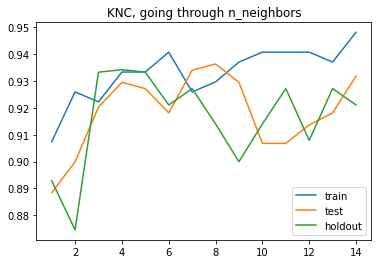

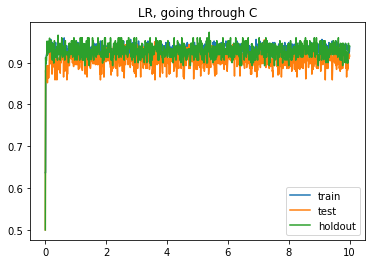

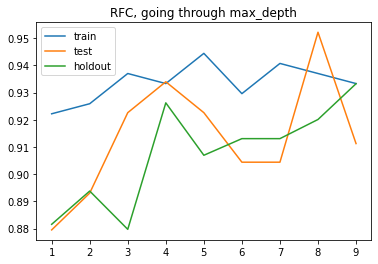

In [68]:
for (model_name, rocs), (param_name, param) in zip(roc_aucs.items(), params.items()):
    plt.title(f'{model_name}, going through {param_name}')
    plt.plot(param, rocs['train'])
    plt.plot(param, rocs['test'])
    plt.plot(param, rocs['holdout'])
    plt.legend(['train', 'test', 'holdout'])
    plt.show()
    print()

Как можно видеть, у всех моделей чаще всего метрика больше на выборке train и holdout, а на test очень сильно проседает, что говорит о переобучении

###  Часть 3. Выбор наилучшей модели

In [69]:
from sklearn.metrics import accuracy_score
from time import time

In [70]:
models_results = pd.DataFrame(columns=['test_acc', 'test_roc', 'holdout_acc', 'holdout_roc', 'test_time', 'holdout_time'])

for model_name, model in models.items():
    test_time = time()
    y_test_pred = model.predict(X_test_transformed)
    test_time = time() - test_time

    holdout_time = time()
    y_holdout_pred = model.predict(X_holdout_transformed)
    holdout_time = time() - holdout_time

    test_acc = accuracy_score(y_test_is_bad, y_test_pred)
    test_roc = roc_auc_score(y_test_is_bad, y_test_pred)

    holdout_acc = accuracy_score(y_holdout_is_bad, y_holdout_pred)
    holdout_roc = roc_auc_score(y_holdout_is_bad, y_holdout_pred)

    models_results.loc[model_name, 'test_acc'] = test_acc
    models_results.loc[model_name, 'test_roc'] = test_roc
    models_results.loc[model_name, 'holdout_acc'] = holdout_acc
    models_results.loc[model_name, 'holdout_roc'] = holdout_roc
    models_results.loc[model_name, 'test_time'] = test_time
    models_results.loc[model_name, 'holdout_time'] = holdout_time

In [71]:
models_results

,test_acc,test_roc,holdout_acc,holdout_roc,test_time,holdout_time
KNC,0.931624,0.91812,0.944954,0.927168,0.0104947,0.00639677
LR,0.923077,0.920299,0.926606,0.913084,0.000579834,0.000495195
RFC,0.91453,0.904421,0.926606,0.913084,0.00543261,0.00569987
SC,0.880342,0.877024,0.93578,0.926242,0.0101047,0.0094595


По метрикам accuracy_score и roc_auc_score на тестовой выборке самым эффективным алгоритмом является ScackingClassifier. Однако по тем же метрикам на holdout-выборке лучшим является алгоритм Логистической регрессии. Также это алгоритм является лучшим (на порядок) по времени на обоих выборках.

Лучшим алгоритмом можно выбрать Логистическую регрессию.